In [1]:
import stlearn as st
import pandas as pd
import os
import pandas as pd
from pathlib import Path
import scanpy as sc
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image 
from typing import Optional, Union
from anndata import AnnData
from scipy import ndimage as ndi
import seaborn as sns
from skimage.transform import rotate

In [2]:
from anndata import AnnData

import stlearn
from pathlib import Path


from matplotlib import cm
import matplotlib as mpl

In [3]:
path = '/Volumes/BiomedML/Projects/SkinSpatial/STRISH/Visium_data/Visium9_BCC_SCC/Visium9_D1/D1/outs/'
# os.path.join(path, "filtered_feature_bc_matrix")


In [4]:
# load data
data = st.Read10X(path)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [8]:
st.settings.set_figure_params(dpi=175)

In [6]:
%matplotlib inline

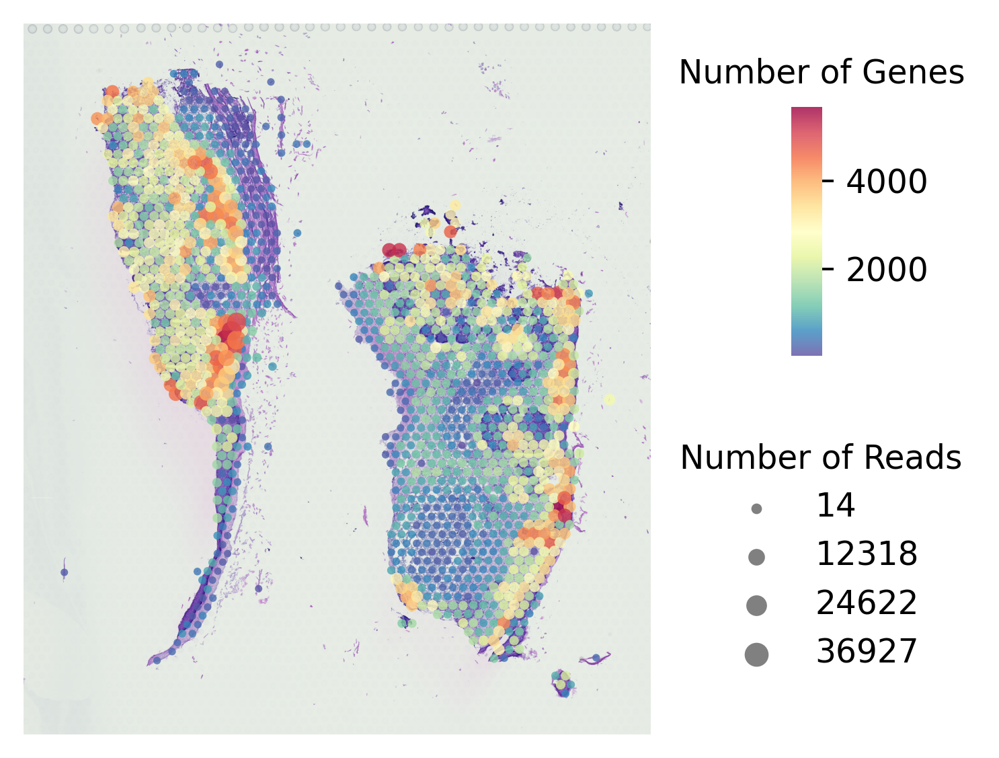

In [9]:
# plt.figure(figsize=(15, 15), dpi=300)
st.pl.QC_plot(data)

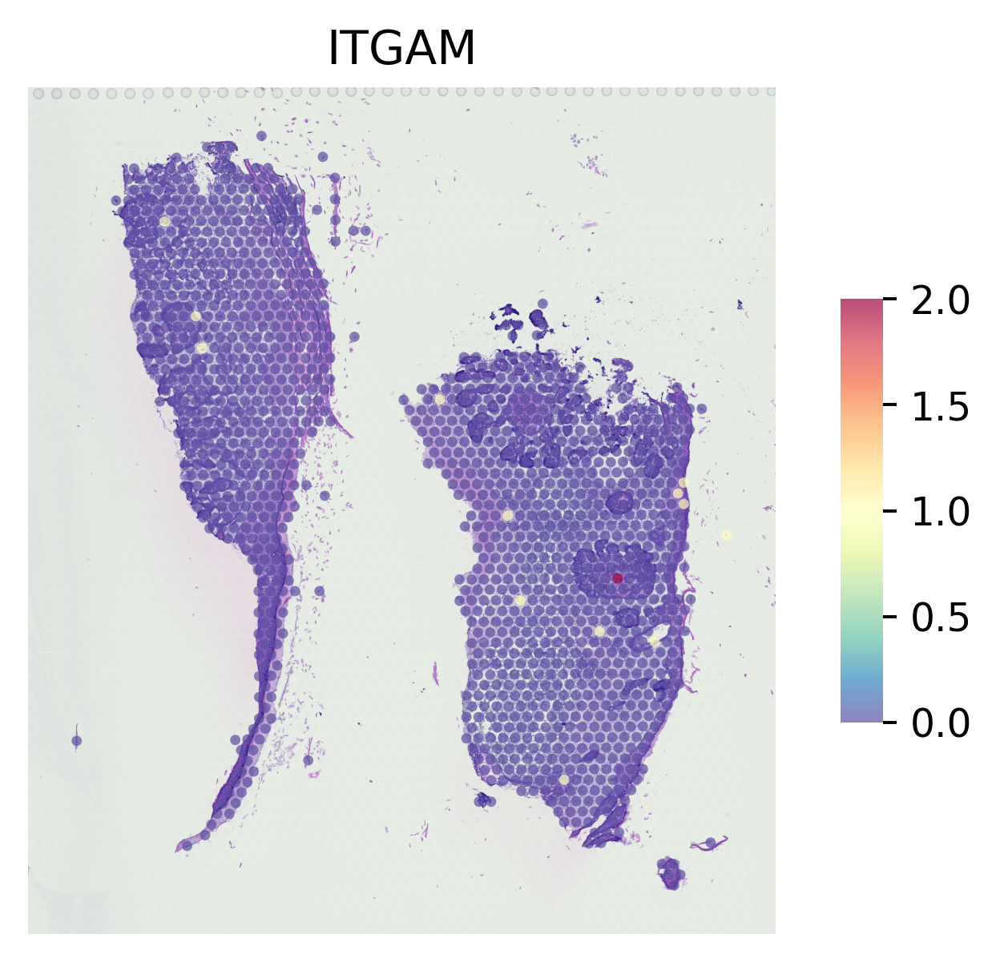

In [25]:
st.pl.gene_plot(data, gene_symbols="ITGAM")
plt.show()

In [10]:
tissues = pd.read_csv( os.path.join(path, 'Tissue_2.csv'), sep=',', index_col = 0)
data.obs['tissue'] = tissues.Tissue_2 # if your object is called "data"
data_subset = data[data.obs['tissue'] == 'Tissue_2']

In [11]:
tissues

,Tissue_2
Barcode,
AAACAAGTATCTCCCA-1,Tissue_2
AAACATTTCCCGGATT-1,Tissue_2
AAACGAGACGGTTGAT-1,Tissue_2
AAACGGGCGTACGGGT-1,Tissue_2
AAAGAATGTGGACTAA-1,NaN
...,...
TTGTGATCTGTTCAGT-1,NaN
TTGTGCAGCCACGTCA-1,Tissue_2
TTGTGGTGGTACTAAG-1,Tissue_2


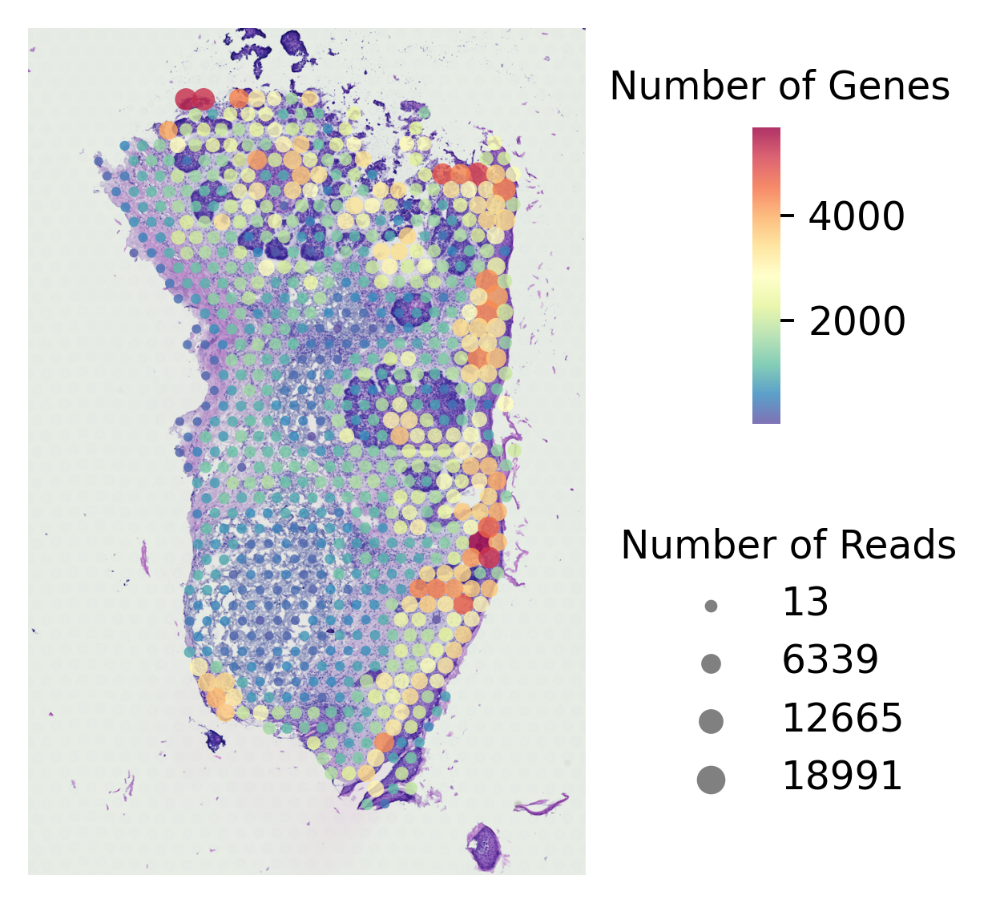

In [12]:
# plt.figure(figsize=(15, 15), dpi=300)
st.pl.QC_plot(data_subset)

In [62]:
# pre-processing for gene count table
st.pp.filter_genes(data_subset,min_cells=1)
st.pp.normalize_total(data_subset)
st.pp.log1p(data_subset)

Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X


In [63]:
data_subset.raw = data_subset

In [64]:
TILE_PATH = Path("Tmp_tiles")

In [65]:
# pre-processing for spot image
st.pp.tiling(data_subset, TILE_PATH)

# this step uses deep learning model to extract high-level features from tile images
# may need few minutes to be completed


Tiling image: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ [ time left: 00:00 ]


In [66]:
st.pp.extract_feature(data_subset)

Extract feature:  13%|███████████████████████████▍                                                                                                                                                                                         [ time left: 00:19 ]/Users/uqmtra12/miniconda3/envs/ultimate_env/lib/python3.8/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!


In [67]:
# run PCA for gene expression data
st.em.run_pca(data_subset,n_comps=50)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


In [89]:
data_subset_SME = data_subset.copy()
# apply stSME to normalise log transformed data
st.spatial.SME.SME_normalize(data_subset_SME, use_data="raw")
data_subset_SME.X = data_subset_SME.obsm['raw_SME_normalized']
st.pp.scale(data_subset_SME)
st.em.run_pca(data_subset_SME,n_comps=50)

Adjusting data: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ [ time left: 00:00 ]


The data adjusted by SME is added to adata.obsm['raw_SME_normalized']
Scale step is finished in adata.X
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
Applying Louvain clustering ...
Louvain clustering is done! The labels are stored in adata.obs['louvain']


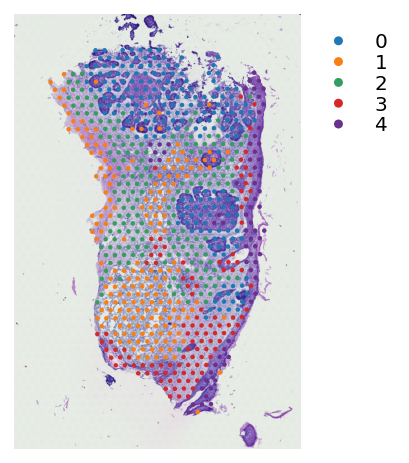

In [90]:
# louvain clustering on stSME normalised data
st.pp.neighbors(data_subset_SME,n_neighbors=17,use_rep='X_pca')
st.tl.clustering.louvain(data_subset_SME, resolution=1.0)
st.pl.cluster_plot(data_subset_SME, use_label="louvain")

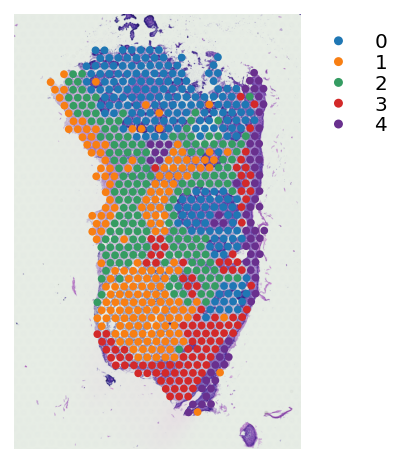

In [92]:
st.pl.cluster_plot(data_subset_SME, use_label="louvain", size=15)


In [93]:
data_subset_SME.obs

,in_tissue,array_row,array_col,imagecol,imagerow,tissue,tile_path,louvain
AAACAAGTATCTCCCA-1,1,50,102,1457,1247,Tissue_2,Tmp_tiles/1457-1247-40.jpeg,3
AAACATTTCCCGGATT-1,1,61,97,1396,1487,Tissue_2,Tmp_tiles/1396-1487-40.jpeg,3
AAACGAGACGGTTGAT-1,1,35,79,1167,922,Tissue_2,Tmp_tiles/1167-922-40.jpeg,2
AAACGGGCGTACGGGT-1,1,65,91,1321,1575,Tissue_2,Tmp_tiles/1321-1575-40.jpeg,3
AAAGTGTGATTTATCT-1,1,44,94,1356,1117,Tissue_2,Tmp_tiles/1356-1117-40.jpeg,0
...,...,...,...,...,...,...,...,...
TTGTAAGGCCAGTTGG-1,1,27,81,1191,748,Tissue_2,Tmp_tiles/1191-748-40.jpeg,0
TTGTGAACCTAATCCG-1,1,56,90,1307,1379,Tissue_2,Tmp_tiles/1307-1379-40.jpeg,1
TTGTGCAGCCACGTCA-1,1,60,74,1108,1467,Tissue_2,Tmp_tiles/1108-1467-40.jpeg,3
TTGTGGTGGTACTAAG-1,1,63,95,1371,1531,Tissue_2,Tmp_tiles/1371-1531-40.jpeg,3


In [94]:
type(data_subset_SME.raw)

anndata._core.raw.Raw

In [95]:
sc.tl.rank_genes_groups(data_subset_SME, 'louvain', method='wilcoxon')


/Users/uqmtra12/miniconda3/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'tissue' as categorical
/Users/uqmtra12/miniconda3/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'feature_types' as categorical
/Users/uqmtra12/miniconda3/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_ca

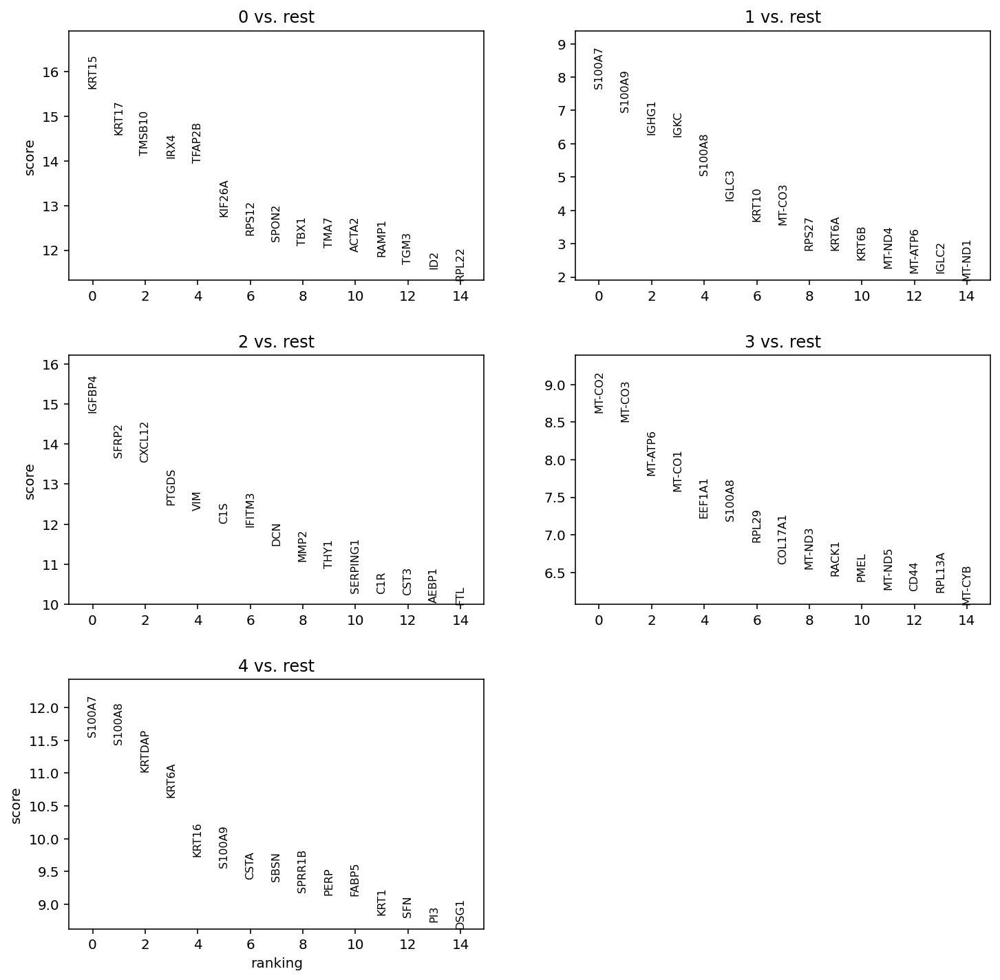

In [96]:
sc.pl.rank_genes_groups(data_subset_SME, n_genes=15, sharey=False, ncols=2)

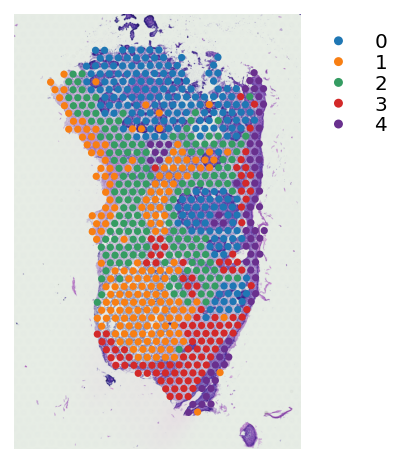

In [100]:
data_subset_SME.obs['cell_type'] = data_subset_SME.obs['louvain']
data_subset_SME.obs['cell_type'] = data_subset_SME.obs['cell_type'].astype('category')
# data_subset_SME.uns['cell_type'] = spot_mixtures

st.pl.cluster_plot(data_subset_SME, use_label='cell_type',size=13)

In [102]:
data_subset_SME.raw.to_adata()

AnnData object with n_obs × n_vars = 750 × 19108
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow', 'tissue', 'tile_path', 'louvain', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial', 'log1p', 'pca', 'gene_expression_correlation', 'physical_distance', 'morphological_distance', 'weights_matrix_all', 'weights_matrix_pd_gd', 'weights_matrix_pd_md', 'weights_matrix_gd_md', 'neighbors', 'louvain', 'louvain_colors', 'rank_genes_groups', 'cell_type_colors'
    obsm: 'spatial', 'X_tile_feature', 'X_morphology', 'X_pca', 'imputed_data', 'top_weights', 'raw_SME_normalized'

In [105]:
data_subset.to_df()

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL732372.1,...,AC133551.1,AC136612.1,AC136616.1,AC136616.3,AC136616.2,AC141272.1,AC023491.2,AC007325.1,AC007325.4,AC007325.2
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACATTTCCCGGATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGAGACGGTTGAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGGGCGTACGGGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAAGTGTGATTTATCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTAAGGCCAGTTGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTGTGAACCTAATCCG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTGTGCAGCCACGTCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTGTGGTGGTACTAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
# Basic normalisation #
st.pp.filter_genes(data_subset, min_cells=3)
st.pp.normalize_total(data_subset) # NOTE: no log1p.


Trying to set attribute `.var` of view, copying.


Normalization step is finished in adata.X


In [15]:
data_subset_SME = sc.read_h5ad('debug_lr_result_plot.h5ad')

In [16]:
data_subset_SME.obs

,in_tissue,array_row,array_col,imagecol,imagerow,tissue,cell_type
AAACAAGTATCTCCCA-1,1,50,102,1457,1247,Tissue_2,3
AAACATTTCCCGGATT-1,1,61,97,1396,1487,Tissue_2,3
AAACGAGACGGTTGAT-1,1,35,79,1167,922,Tissue_2,2
AAACGGGCGTACGGGT-1,1,65,91,1321,1575,Tissue_2,3
AAAGTGTGATTTATCT-1,1,44,94,1356,1117,Tissue_2,0
...,...,...,...,...,...,...,...
TTGTAAGGCCAGTTGG-1,1,27,81,1191,748,Tissue_2,0
TTGTGAACCTAATCCG-1,1,56,90,1307,1379,Tissue_2,1
TTGTGCAGCCACGTCA-1,1,60,74,1108,1467,Tissue_2,3
TTGTGGTGGTACTAAG-1,1,63,95,1371,1531,Tissue_2,3


In [17]:
data_subset.obs['cell_type'] = data_subset_SME.obs['cell_type'].astype('category')


In [18]:
data_subset.obs

,in_tissue,array_row,array_col,imagecol,imagerow,tissue,cell_type
AAACAAGTATCTCCCA-1,1,50,102,1457,1247,Tissue_2,3
AAACATTTCCCGGATT-1,1,61,97,1396,1487,Tissue_2,3
AAACGAGACGGTTGAT-1,1,35,79,1167,922,Tissue_2,2
AAACGGGCGTACGGGT-1,1,65,91,1321,1575,Tissue_2,3
AAAGTGTGATTTATCT-1,1,44,94,1356,1117,Tissue_2,0
...,...,...,...,...,...,...,...
TTGTAAGGCCAGTTGG-1,1,27,81,1191,748,Tissue_2,0
TTGTGAACCTAATCCG-1,1,56,90,1307,1379,Tissue_2,1
TTGTGCAGCCACGTCA-1,1,60,74,1108,1467,Tissue_2,3
TTGTGGTGGTACTAAG-1,1,63,95,1371,1531,Tissue_2,3


In [19]:
# Loading the LR databases available within stlearn (from NATMI)
lrs = st.tl.cci.load_lrs(['connectomeDB2020_lit'], species='human')
print(len(lrs))

# Running the analysis #
st.tl.cci.run(data_subset, lrs,
                  min_spots = 20, #Filter out any LR pairs with no scores for less than min_spots
                  distance=None, # None defaults to spot+immediate neighbours; distance=0 for within-spot mode
                  n_pairs=1000, # Number of random pairs to generate; low as example, recommend ~10,000
                  n_cpus=4, # Number of CPUs for parallel. If None, detects & use all available.
                  )

lr_info = data_subset.uns['lr_summary'] # A dataframe detailing the LR pairs ranked by number of significant spots.
print('\n', lr_info)

2293
Calculating neighbours...
0 spots with no neighbours, 6 median spot neighbours.
Spot neighbour indices stored in adata.obsm['spot_neighbours'] & adata.obsm['spot_neigh_bcs'].
Altogether 754 valid L-R pairs


Generating backgrounds & testing each LR pair...: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ [ time left: 00:00 ]



Storing results:

lr_scores stored in adata.obsm['lr_scores'].
p_vals stored in adata.obsm['p_vals'].
p_adjs stored in adata.obsm['p_adjs'].
-log10(p_adjs) stored in adata.obsm['-log10(p_adjs)'].
lr_sig_scores stored in adata.obsm['lr_sig_scores'].

Per-spot results in adata.obsm have columns in same order as rows in adata.uns['lr_summary'].
Summary of LR results in adata.uns['lr_summary'].

               n_spots  n_spots_sig  n_spots_sig_pval
POSTN_PTK7        360           32                74
C3_LRP1           281           30                72
COL1A2_CD44       629           27                59
COL1A1_CD44       595           27                55
A2M_LRP1          421           25                86
...               ...          ...               ...
MFNG_NOTCH1        23            0                18
SLIT2_GPC1         37            0                17
SLIT2_APP          45            0                25
PDGFA_PDGFRA      222            0                32
WNT10A_FZD1        4

In [21]:
?st.pl.lr_summary

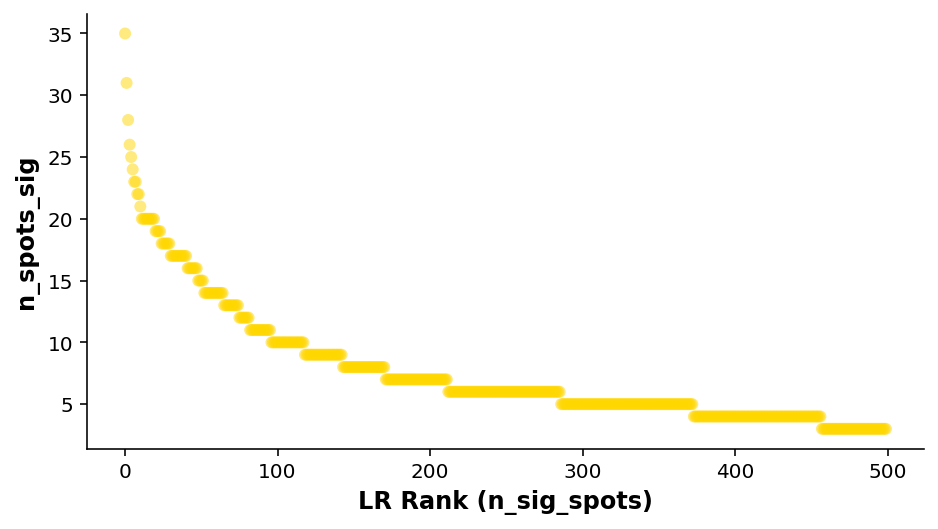

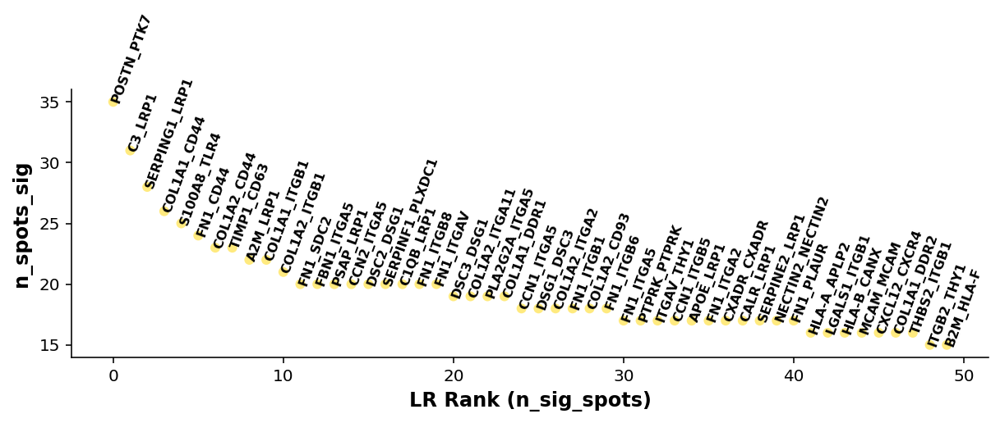

In [111]:
st.pl.lr_summary(data_subset, n_top=500)
st.pl.lr_summary(data_subset, n_top=50, figsize=(10,3))

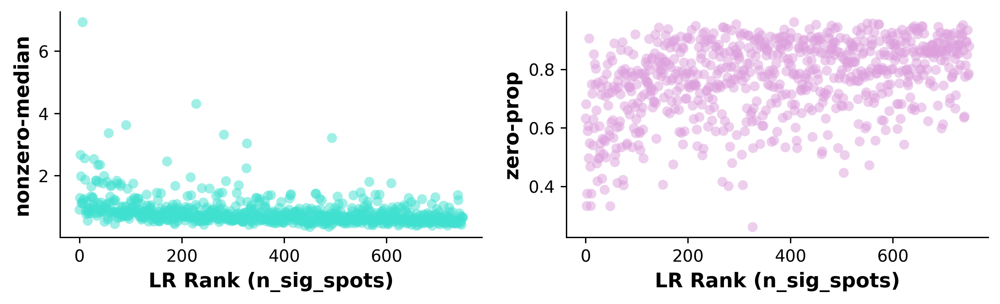

In [22]:
st.pl.lr_diagnostics(data_subset, figsize=(10,2.5))

In [112]:
data_subset

AnnData object with n_obs × n_vars = 750 × 15839
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow', 'tissue', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial', 'lrfeatures', 'lr_summary'
    obsm: 'spatial', 'spot_neighbours', 'spot_neigh_bcs', 'lr_scores', 'p_vals', 'p_adjs', '-log10(p_adjs)', 'lr_sig_scores'

In [125]:
lr_info

,n_spots,n_spots_sig,n_spots_sig_pval
POSTN_PTK7,360,35,74
C3_LRP1,281,31,72
SERPING1_LRP1,388,28,83
COL1A1_CD44,595,26,57
S100A8_TLR4,119,25,91
...,...,...,...
NTN1_UNC5B,70,0,30
WNT3_FZD1,32,0,14
WNT3_FZD7,28,0,10
SLIT2_APP,45,0,26


In [128]:
data_subset.uns['lr_summary']

,n_spots,n_spots_sig,n_spots_sig_pval
POSTN_PTK7,360,35,74
C3_LRP1,281,31,72
SERPING1_LRP1,388,28,83
COL1A1_CD44,595,26,57
S100A8_TLR4,119,25,91
...,...,...,...
NTN1_UNC5B,70,0,30
WNT3_FZD1,32,0,14
WNT3_FZD7,28,0,10
SLIT2_APP,45,0,26


In [130]:
for idx in lr_info.index:
    if 'CSF1R' in idx:
        print(idx)
    if 'THY1' in idx:
        print(idx)
    if 'ITGAM' in idx:
        print(idx)

ITGAV_THY1
ITGB2_THY1
C3_ITGAM
IL34_CSF1R
CCN2_ITGAM
CCN1_ITGAM
CSF1_CSF1R
SPON2_ITGAM


In [169]:
for idx in data_subset.uns['lr_summary'].index:
    if 'CSF1R' in idx:
        print('CSF1R:', idx)
    if 'THY1' in idx:
        print('THY1:',idx)
    if 'ITGAM' in idx:
        print('ITGAM:',idx)

THY1: ITGAV_THY1
THY1: ITGB2_THY1
ITGAM: C3_ITGAM
CSF1R: IL34_CSF1R
ITGAM: CCN2_ITGAM
ITGAM: CCN1_ITGAM
CSF1R: CSF1_CSF1R
ITGAM: SPON2_ITGAM


In [137]:
# data_subset.obsm.to_df()
best_lr = 'IL34_CSF1R'
data_subset.uns['lr_summary'].loc[best_lr]

n_spots             23
n_spots_sig          5
n_spots_sig_pval    18
Name: IL34_CSF1R, dtype: int64

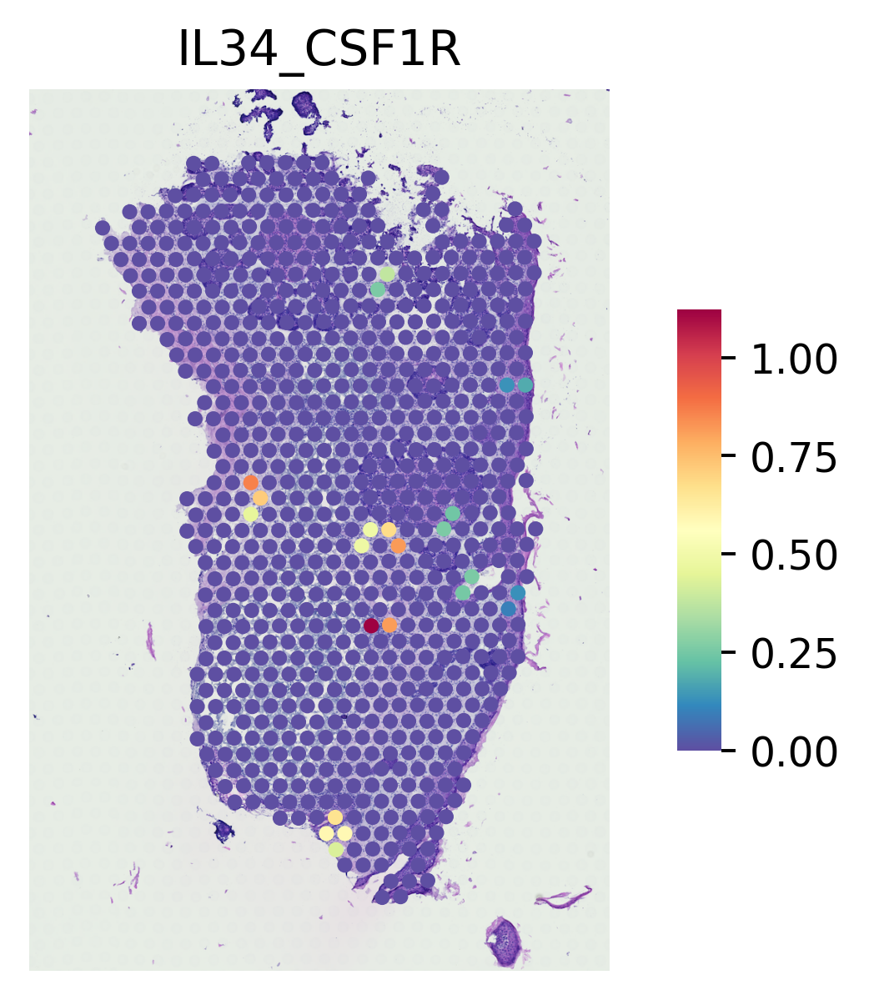

In [165]:
st.pl.lr_result_plot(data_subset, use_result='lr_scores', use_lr=best_lr, size=14)
plt.show()

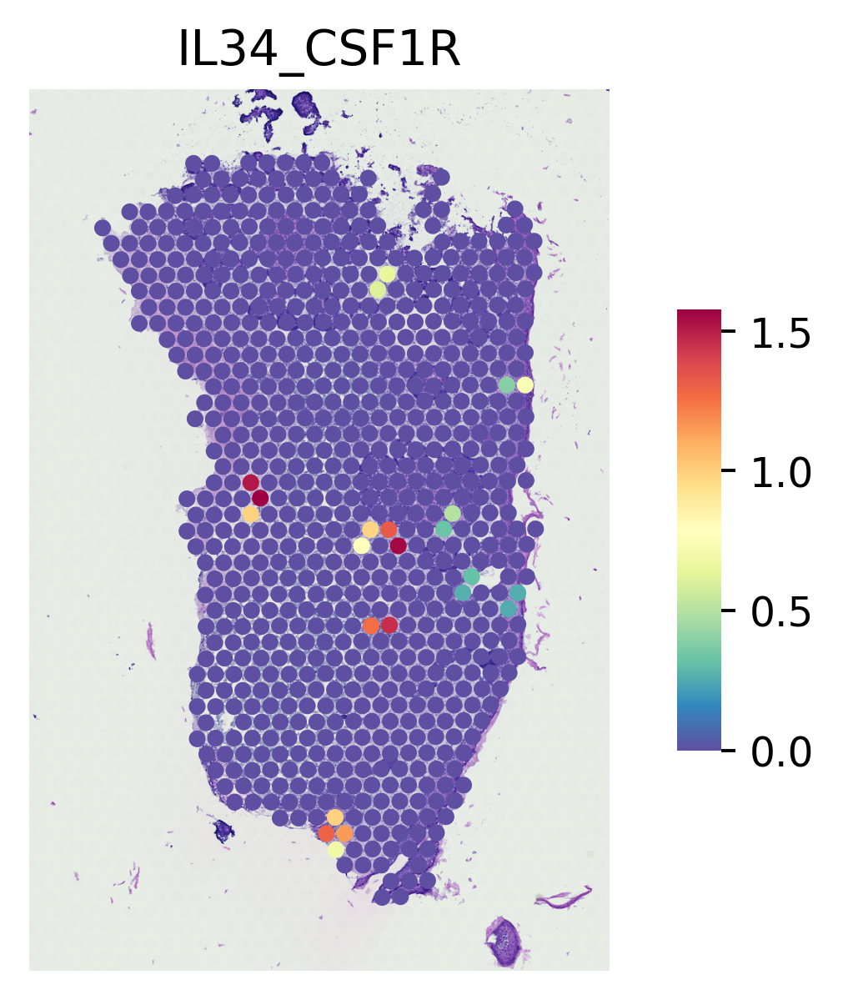

In [167]:
st.pl.lr_result_plot(data_subset, use_result='-log10(p_adjs)', use_lr=best_lr, size=17)
plt.show()

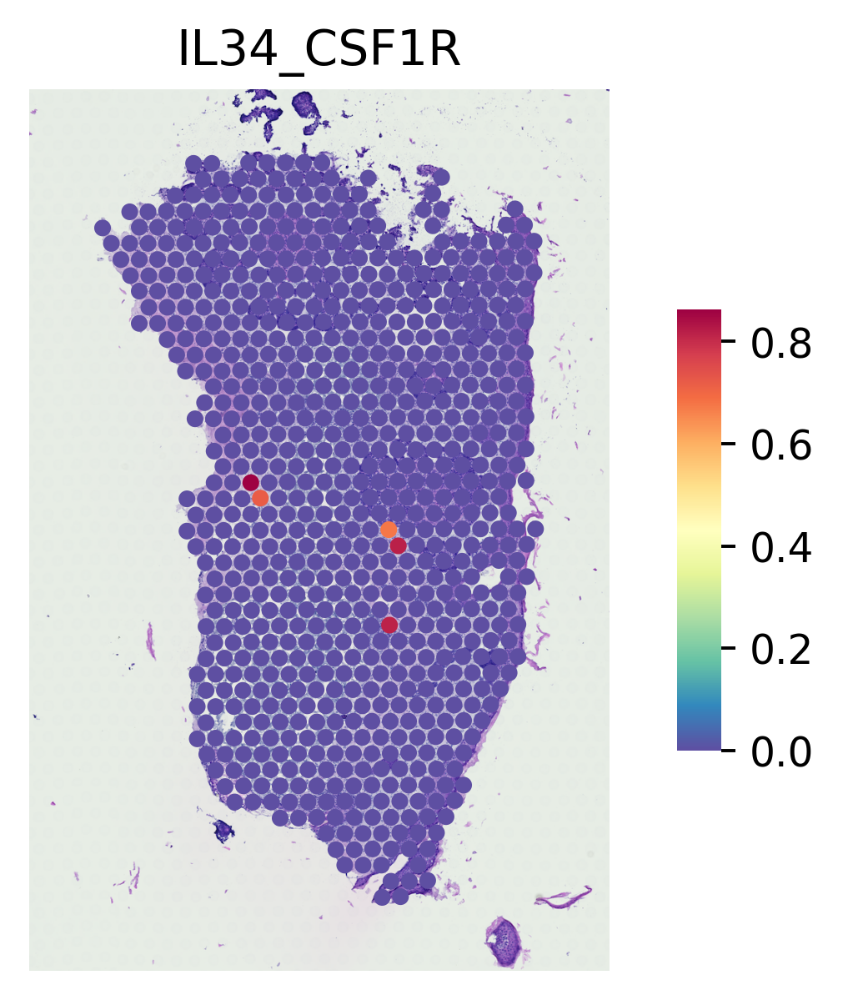

In [184]:
st.pl.lr_result_plot(data_subset, use_result='lr_sig_scores', use_lr=best_lr, size=17)
plt.show()

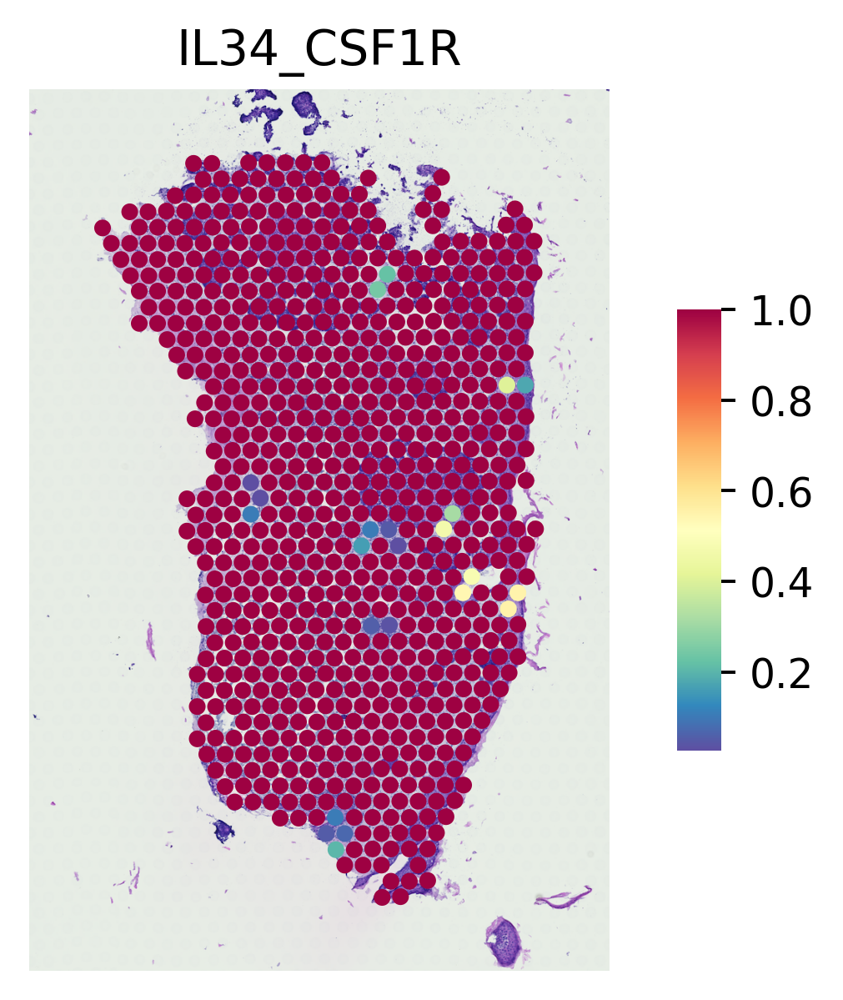

In [187]:
st.pl.lr_result_plot(data_subset, use_result='p_adjs', use_lr=best_lr, size=17)
plt.show()

In [135]:
data_subset

AnnData object with n_obs × n_vars = 750 × 15839
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow', 'tissue', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial', 'lrfeatures', 'lr_summary'
    obsm: 'spatial', 'spot_neighbours', 'spot_neigh_bcs', 'lr_scores', 'p_vals', 'p_adjs', '-log10(p_adjs)', 'lr_sig_scores'

In [181]:
?st.pl.lr_plot

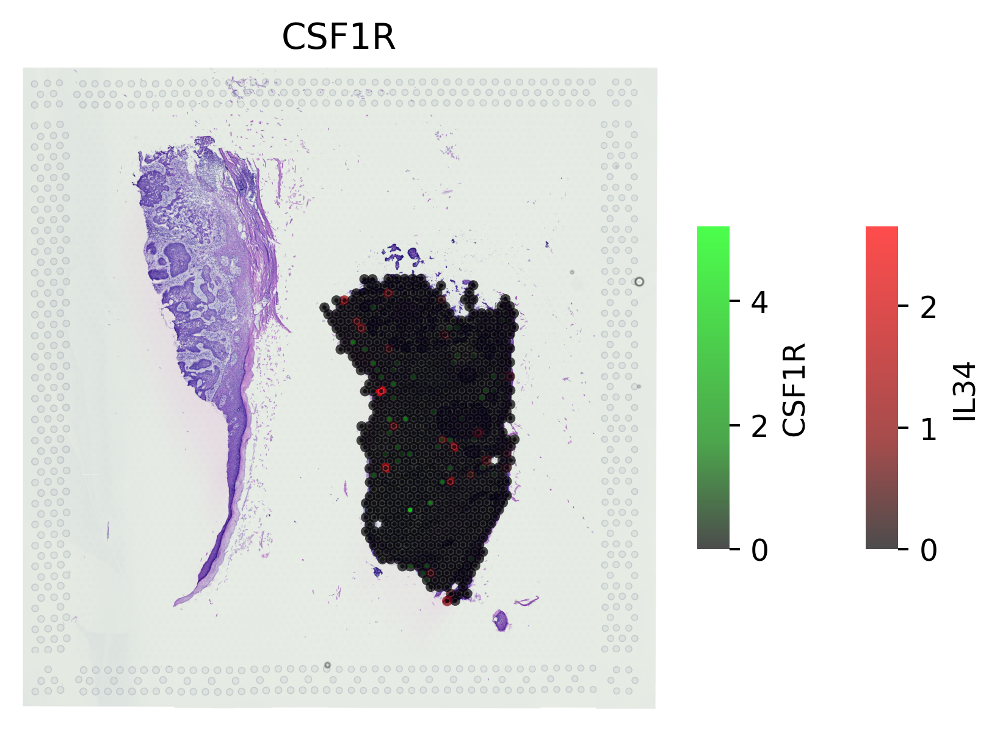

In [180]:
# All spots #
st.pl.lr_plot(data_subset, best_lr,
              inner_size_prop=0.04, middle_size_prop=.07, outer_size_prop=.4,
              outer_mode='continuous', pt_scale=30,
              use_label=None, show_image=True,
              sig_spots=False)
# plt.show()

In [182]:
?st.pl.lr_plot

Trying to set attribute `.obs` of view, copying.


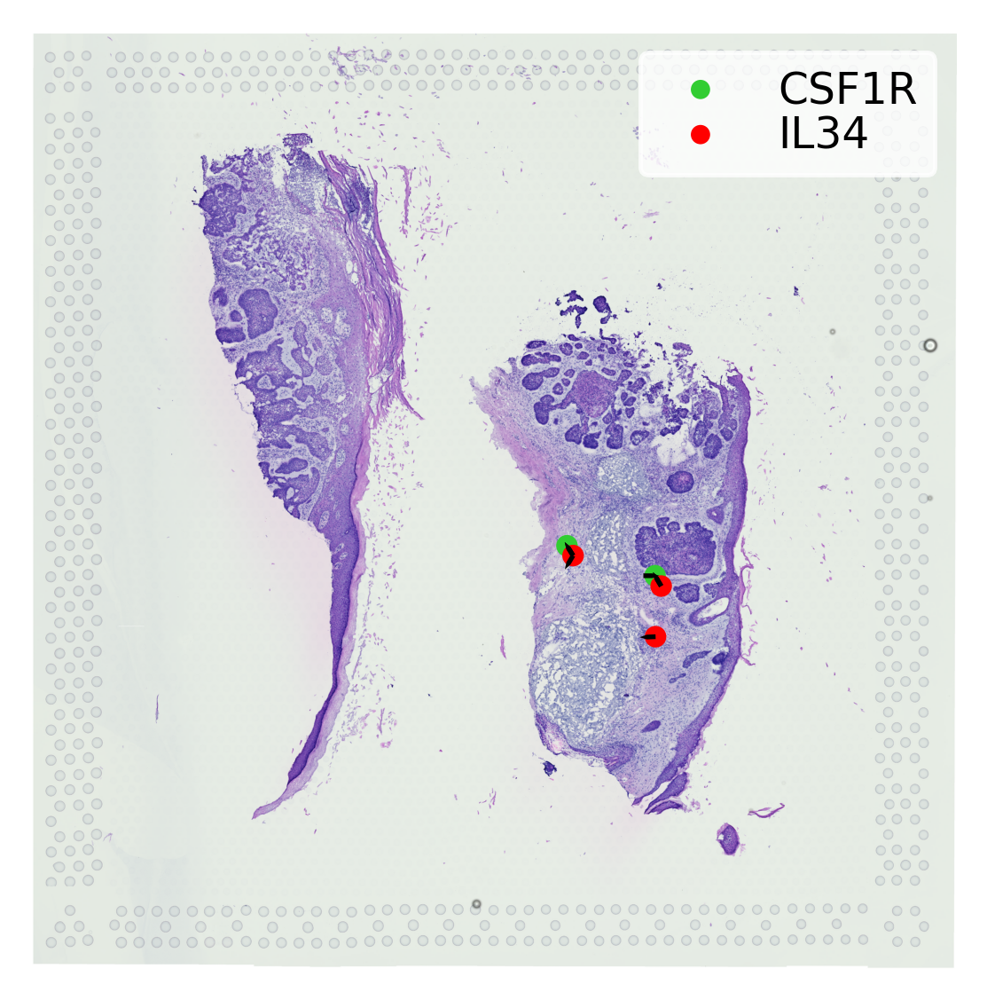

In [185]:
st.pl.lr_plot(data_subset, best_lr, 
              inner_size_prop=0.08, middle_size_prop=.3, outer_size_prop=.5,
              outer_mode='binary', pt_scale=50,
              show_image=True, arrow_width=10, arrow_head_width=10,
              sig_spots=True, show_arrows=True)

Trying to set attribute `.obs` of view, copying.


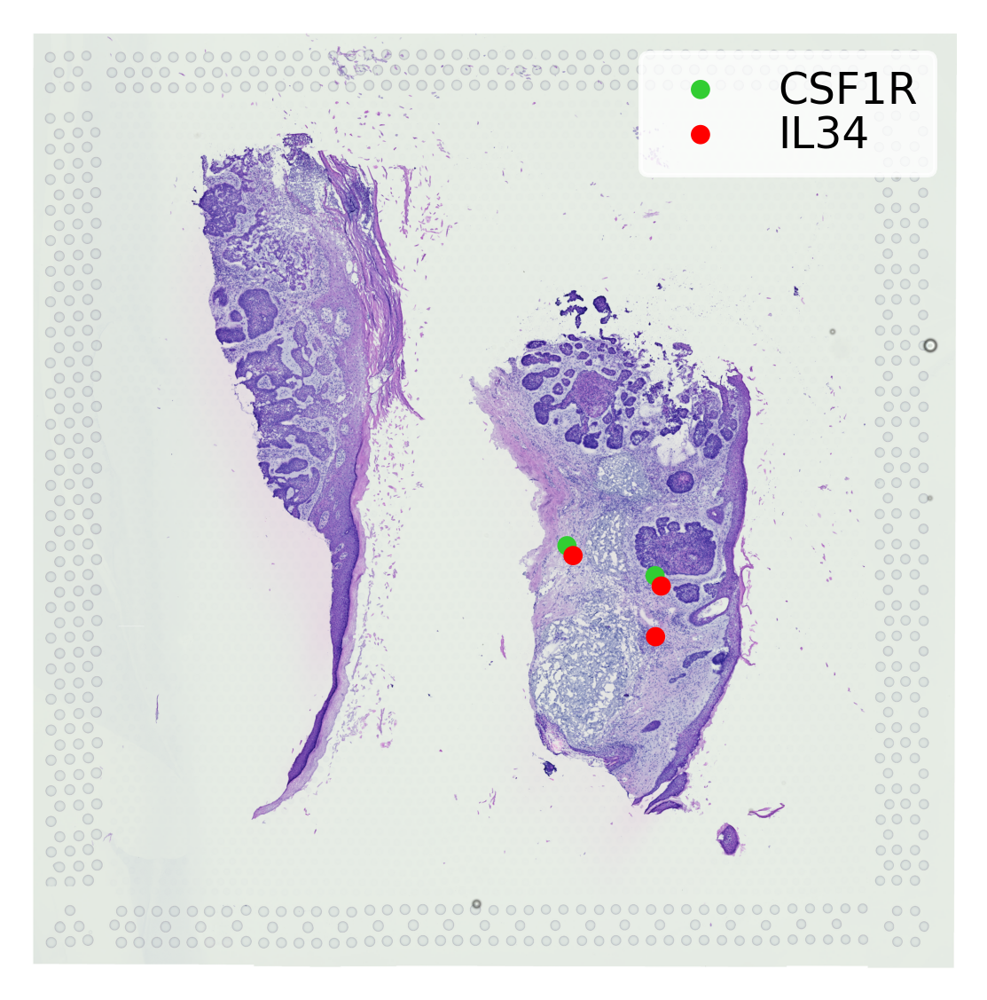

In [164]:
st.pl.lr_plot(data_subset, best_lr, outer_size_prop=1, outer_mode='binary', pt_scale=20,
              use_label=None, show_image=True,
              sig_spots=True)

In [188]:
best_lr2 = data_subset.uns['lr_summary'].index.values[0]
best_lr2

'POSTN_PTK7'

In [ ]:
r_path = '/Users/uqmtra12/miniconda3/envs/ultimate_env/bin/R'
st.tl.cci.run_lr_go(data_subset, r_path)

cannot find system Renviron


Fatal error: unable to open the base package

